#**How to Train YOLOv12 Object Detection Model on a Custom Dataset**

In [1]:
!nvidia-smi

Tue Apr 15 12:29:33 2025       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 550.54.15              Driver Version: 550.54.15      CUDA Version: 12.4     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  Tesla T4                       Off |   00000000:00:04.0 Off |                    0 |
| N/A   45C    P8              9W /   70W |       0MiB /  15360MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

**Step 01 # Install the Required Packages**

**NOTE:** Currently, YOLOv12 does not have its own PyPI package, so we install it directly from GitHub and flash-attn (to accelerate attention-based computations via optimized CUDA kernels).

In [2]:
!pip install -q git+https://github.com/sunsmarterjie/yolov12.git  flash-attn

  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done


**Step 02 # Import All the Requried Libraries**

In [3]:
import os
import ultralytics
ultralytics.checks()

Ultralytics 8.3.63 🚀 Python-3.11.12 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
Setup complete ✅ (2 CPUs, 12.7 GB RAM, 42.1/112.6 GB disk)


In [4]:
from ultralytics import YOLO
from IPython.display import Image

In [5]:
HOME = os.getcwd()
print(HOME)

/content


**Step # 03 Download Dataset from Roboflow**

https://universe.roboflow.com/muhammadmoin-arxtl/potholes-detection-jbnou/dataset/1

In [6]:
!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="C4bJWiCo5Qcs5teppFqY")
project = rf.workspace("muhammadmoin-arxtl").project("potholes-detection-jbnou")
version = project.version(1)
dataset = version.download("yolov12")


loading Roboflow workspace...
loading Roboflow project...


In [7]:
!ls {dataset.location}

data.yaml  README.dataset.txt  README.roboflow.txt  test  train  valid


**Step # 04 Fine-tune YOLOv12 model on a Custom Dataset**

**NOTE:** We need to make a few changes to our downloaded dataset so it will work with YOLOv12. Run the following bash commands to prepare your dataset for training by updating the relative paths in the `data.yaml` file, ensuring it correctly points to the subdirectories for your dataset's `train`, `test`, and `valid` subsets.

In [8]:
!sed -i '$d' {dataset.location}/data.yaml
!sed -i '$d' {dataset.location}/data.yaml
!sed -i '$d' {dataset.location}/data.yaml
!sed -i '$d' {dataset.location}/data.yaml
!echo -e "test: ../test/images\ntrain: ../train/images\nval: ../valid/images" >> {dataset.location}/data.yaml

In [9]:
!cat {dataset.location}/data.yaml

train: ../train/images
val: ../valid/images
test: ../test/images

nc: 1
names: ['0']

roboflow:
  workspace: muhammadmoin-arxtl
test: ../test/images
train: ../train/images
val: ../valid/images


We are now ready to fine-tune our YOLOv12 model. In the code below, we initialize the model using a starting checkpoint—here, we use `yolov12m.yaml`, but you can replace it with any other model (e.g., `yolov12n.pt`, `yolov12m.pt`, `yolov12l.pt`, or `yolov12x.pt`) based on your preference. We set the training to run for 50 epochs in this example; however, you should adjust the number of epochs along with other hyperparameters such as batch size, image size, and augmentation settings (scale, mosaic, mixup, and copy-paste) based on your hardware capabilities and dataset size.

**Note:** **Note that after training, you might encounter a `TypeError: argument of type 'PosixPath' is not iterable error` — this is a known issue, but your model weights will still be saved, so you can safely proceed to running inference.**

In [11]:
model = YOLO('yolov12m.yaml')

results = model.train(data=f'{dataset.location}/data.yaml', epochs=50)

New https://pypi.org/project/ultralytics/8.3.108 available 😃 Update with 'pip install -U ultralytics'
Ultralytics 8.3.63 🚀 Python-3.11.12 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: task=detect, mode=train, model=yolov12m.yaml, data=/content/Potholes-Detection-1/data.yaml, epochs=50, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=Fa

100%|██████████| 755k/755k [00:00<00:00, 24.9MB/s]


Overriding model.yaml nc=80 with nc=1

                   from  n    params  module                                       arguments                     
  0                  -1  1      1856  ultralytics.nn.modules.conv.Conv             [3, 64, 3, 2]                 
  1                  -1  1     37120  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2, 1, 2]         
  2                  -1  1    111872  ultralytics.nn.modules.block.C3k2            [128, 256, 1, True, 0.25]     
  3                  -1  1    147968  ultralytics.nn.modules.conv.Conv             [256, 256, 3, 2, 1, 4]        
  4                  -1  1    444928  ultralytics.nn.modules.block.C3k2            [256, 512, 1, True, 0.25]     
  5                  -1  1   2360320  ultralytics.nn.modules.conv.Conv             [512, 512, 3, 2]              
  6                  -1  2   2664960  ultralytics.nn.modules.block.A2C2f           [512, 512, 2, True, 4]        
  7                  -1  1   2360320  ultralytics

100%|██████████| 5.26M/5.26M [00:00<00:00, 92.5MB/s]


AMP: checks passed ✅


train: Scanning /content/Potholes-Detection-1/train/labels... 465 images, 0 backgrounds, 0 corrupt: 100%|██████████| 465/465 [00:00<00:00, 2271.14it/s]

train: New cache created: /content/Potholes-Detection-1/train/labels.cache


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


Argument(s) 'quality_lower' are not valid for transform ImageCompression
val: Scanning /content/Potholes-Detection-1/valid/labels... 133 images, 0 backgrounds, 0 corrupt: 100%|██████████| 133/133 [00:00<00:00, 1241.27it/s]

val: New cache created: /content/Potholes-Detection-1/valid/labels.cache


Plotting labels to runs/detect/train/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.002, momentum=0.9) with parameter groups 131 weight(decay=0.0), 138 weight(decay=0.0005), 137 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to runs/detect/train
Starting training for 50 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/50      12.5G      3.673      3.973       4.23          1        640: 100%|██████████| 30/30 [00:28<00:00,  1.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:03<00:00,  1.33it/s]


                   all        133        299    0.00193      0.258    0.00172   0.000613

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/50      12.2G      3.509      3.736      4.026          4        640: 100%|██████████| 30/30 [00:27<00:00,  1.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  1.74it/s]

                   all        133        299    0.00203      0.271     0.0016   0.000515



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/50      12.1G      3.235      3.461       3.65          6        640: 100%|██████████| 30/30 [00:27<00:00,  1.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:03<00:00,  1.48it/s]

                   all        133        299    0.00216      0.288     0.0023    0.00076



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/50      12.1G      3.011      3.283      3.402          3        640: 100%|██████████| 30/30 [00:27<00:00,  1.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  1.75it/s]

                   all        133        299     0.0197     0.0769    0.00833    0.00223



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/50      12.1G      2.938      3.206       3.23          1        640: 100%|██████████| 30/30 [00:27<00:00,  1.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:03<00:00,  1.60it/s]


                   all        133        299       0.04     0.0836     0.0122    0.00313

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/50      12.1G      2.938      3.128      3.155          9        640: 100%|██████████| 30/30 [00:27<00:00,  1.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:03<00:00,  1.60it/s]

                   all        133        299     0.0152      0.191    0.00675    0.00188



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/50      12.4G      2.752       3.08      3.048          1        640: 100%|██████████| 30/30 [00:27<00:00,  1.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:03<00:00,  1.60it/s]

                   all        133        299      0.134      0.087     0.0362     0.0129



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/50      12.1G      2.719          3      2.944          2        640: 100%|██████████| 30/30 [00:27<00:00,  1.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:03<00:00,  1.65it/s]

                   all        133        299      0.117      0.137     0.0473     0.0131



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/50      12.1G      2.685      2.945      2.925          1        640: 100%|██████████| 30/30 [00:27<00:00,  1.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  1.68it/s]

                   all        133        299      0.128      0.187     0.0852     0.0253



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/50      12.1G      2.613      2.815      2.839          5        640: 100%|██████████| 30/30 [00:27<00:00,  1.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  1.69it/s]

                   all        133        299      0.141      0.134     0.0639     0.0188



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/50      12.4G      2.577      2.825      2.846          1        640: 100%|██████████| 30/30 [00:27<00:00,  1.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  1.73it/s]

                   all        133        299      0.158      0.251      0.127     0.0453



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/50      12.2G      2.648      2.767      2.782          1        640: 100%|██████████| 30/30 [00:27<00:00,  1.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  1.68it/s]

                   all        133        299      0.218      0.181      0.113     0.0372



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/50      12.4G        2.5      2.675      2.748          6        640: 100%|██████████| 30/30 [00:27<00:00,  1.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  1.77it/s]

                   all        133        299      0.193      0.157     0.0988     0.0379



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/50      12.2G      2.567      2.762      2.757          1        640: 100%|██████████| 30/30 [00:27<00:00,  1.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  1.74it/s]

                   all        133        299      0.221      0.251      0.146     0.0496



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/50      12.1G      2.401      2.607      2.642          3        640: 100%|██████████| 30/30 [00:27<00:00,  1.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  1.77it/s]

                   all        133        299      0.203      0.271      0.174      0.058



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/50      12.1G      2.364      2.564      2.604          1        640: 100%|██████████| 30/30 [00:27<00:00,  1.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  1.75it/s]

                   all        133        299      0.185      0.237      0.116     0.0377



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/50      12.1G      2.344       2.51      2.591          6        640: 100%|██████████| 30/30 [00:27<00:00,  1.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:03<00:00,  1.62it/s]

                   all        133        299      0.253      0.308      0.191     0.0768



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/50      12.1G       2.34      2.562      2.618          1        640: 100%|██████████| 30/30 [00:27<00:00,  1.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  1.76it/s]

                   all        133        299      0.263      0.351      0.209     0.0867



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/50      12.4G      2.303      2.466      2.556          2        640: 100%|██████████| 30/30 [00:27<00:00,  1.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  1.74it/s]

                   all        133        299      0.239      0.324      0.202     0.0796



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/50      12.2G      2.265      2.384      2.499          5        640: 100%|██████████| 30/30 [00:27<00:00,  1.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  1.76it/s]

                   all        133        299      0.334      0.304      0.241     0.0976



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/50      12.4G      2.227      2.372      2.484          1        640: 100%|██████████| 30/30 [00:27<00:00,  1.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  1.77it/s]

                   all        133        299      0.349      0.324      0.277      0.109



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/50      12.1G      2.206       2.35      2.469         11        640: 100%|██████████| 30/30 [00:27<00:00,  1.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  1.70it/s]


                   all        133        299      0.257      0.365      0.241     0.0857

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/50      12.1G      2.169      2.265      2.445          3        640: 100%|██████████| 30/30 [00:27<00:00,  1.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  1.75it/s]

                   all        133        299      0.318      0.415      0.277      0.117



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/50      12.2G      2.129      2.295      2.419          3        640: 100%|██████████| 30/30 [00:27<00:00,  1.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  1.70it/s]

                   all        133        299      0.335      0.334      0.287      0.126



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/50      12.4G       2.13      2.215      2.365          3        640: 100%|██████████| 30/30 [00:27<00:00,  1.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  1.77it/s]

                   all        133        299      0.373      0.378      0.319      0.137



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/50      12.1G      2.131      2.235      2.389          4        640: 100%|██████████| 30/30 [00:27<00:00,  1.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  1.77it/s]

                   all        133        299      0.357      0.385      0.307      0.133



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/50      12.1G      2.068      2.134      2.324          4        640: 100%|██████████| 30/30 [00:27<00:00,  1.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  1.78it/s]

                   all        133        299      0.284      0.338      0.306      0.136



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/50      12.1G       2.04      2.123      2.296          2        640: 100%|██████████| 30/30 [00:27<00:00,  1.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  1.77it/s]

                   all        133        299      0.453      0.415      0.385      0.189



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/50      12.4G      2.027       2.11      2.295          2        640: 100%|██████████| 30/30 [00:27<00:00,  1.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  1.68it/s]

                   all        133        299      0.426      0.371       0.36      0.168



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/50      12.1G      2.046      2.042      2.255          9        640: 100%|██████████| 30/30 [00:27<00:00,  1.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  1.73it/s]

                   all        133        299      0.453      0.361       0.39      0.181



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      31/50      12.1G      1.973      2.084       2.23          6        640: 100%|██████████| 30/30 [00:27<00:00,  1.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  1.76it/s]

                   all        133        299      0.414      0.405      0.369       0.18



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      32/50      12.2G      1.951       2.01      2.215          1        640: 100%|██████████| 30/30 [00:27<00:00,  1.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  1.74it/s]

                   all        133        299      0.507      0.441      0.457      0.214



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      33/50      12.4G      1.875      2.045      2.095          0        640: 100%|██████████| 30/30 [00:27<00:00,  1.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  1.75it/s]

                   all        133        299      0.486      0.435      0.421      0.199



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      34/50      12.2G      1.931      1.923      2.183          3        640: 100%|██████████| 30/30 [00:27<00:00,  1.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  1.72it/s]


                   all        133        299      0.532      0.411      0.452      0.216

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      35/50      12.1G      1.913      1.909      2.095          4        640: 100%|██████████| 30/30 [00:27<00:00,  1.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  1.72it/s]

                   all        133        299       0.54      0.419      0.428      0.211



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      36/50      12.1G      1.933      1.903      2.176          3        640: 100%|██████████| 30/30 [00:27<00:00,  1.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  1.76it/s]

                   all        133        299      0.487      0.415      0.452      0.227



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      37/50      12.4G      1.883      1.896      2.148          4        640: 100%|██████████| 30/30 [00:27<00:00,  1.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  1.73it/s]

                   all        133        299      0.551      0.458      0.493      0.242



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      38/50      12.2G      1.858      1.799      2.088          3        640: 100%|██████████| 30/30 [00:27<00:00,  1.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  1.78it/s]

                   all        133        299      0.477      0.418      0.448       0.22



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      39/50      12.4G      1.799      1.862      2.071          1        640: 100%|██████████| 30/30 [00:27<00:00,  1.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  1.78it/s]

                   all        133        299      0.573      0.455      0.502      0.264



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      40/50      12.2G      1.781      1.799      2.066          3        640: 100%|██████████| 30/30 [00:27<00:00,  1.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  1.70it/s]

                   all        133        299      0.556      0.525      0.541      0.284


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


Argument(s) 'quality_lower' are not valid for transform ImageCompression



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      41/50      12.1G      1.727      1.858      2.055          3        640: 100%|██████████| 30/30 [00:28<00:00,  1.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  1.76it/s]

                   all        133        299      0.513      0.495      0.519      0.284



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      42/50      12.1G      1.719       1.72      2.034          3        640: 100%|██████████| 30/30 [00:27<00:00,  1.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  1.77it/s]

                   all        133        299      0.592      0.485      0.559       0.29



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      43/50      12.1G      1.729      1.704      2.084          1        640: 100%|██████████| 30/30 [00:27<00:00,  1.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  1.76it/s]

                   all        133        299      0.618      0.515      0.572        0.3



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      44/50      12.1G      1.666      1.723       1.99          1        640: 100%|██████████| 30/30 [00:27<00:00,  1.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  1.77it/s]

                   all        133        299      0.586      0.544      0.574      0.317



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      45/50      12.1G      1.669      1.675      1.994          1        640: 100%|██████████| 30/30 [00:27<00:00,  1.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  1.69it/s]

                   all        133        299      0.658      0.505      0.597      0.322



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      46/50      12.1G      1.647      1.657      2.002          1        640: 100%|██████████| 30/30 [00:27<00:00,  1.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  1.77it/s]

                   all        133        299      0.615      0.512      0.585      0.324



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      47/50      12.4G      1.679      1.667      1.988          1        640: 100%|██████████| 30/30 [00:27<00:00,  1.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  1.77it/s]

                   all        133        299      0.567      0.579      0.599      0.329



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      48/50      12.2G      1.638      1.597      1.986          3        640: 100%|██████████| 30/30 [00:27<00:00,  1.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  1.75it/s]

                   all        133        299      0.649      0.551      0.624      0.349



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      49/50      12.1G      1.644      1.594       1.96          4        640: 100%|██████████| 30/30 [00:27<00:00,  1.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  1.77it/s]

                   all        133        299      0.627      0.579      0.637      0.351



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      50/50      12.1G      1.606      1.574      1.941          1        640: 100%|██████████| 30/30 [00:27<00:00,  1.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  1.71it/s]

                   all        133        299      0.647      0.562      0.636       0.35



50 epochs completed in 0.452 hours.
Optimizer stripped from runs/detect/train/weights/last.pt, 39.7MB
Optimizer stripped from runs/detect/train/weights/best.pt, 39.7MB

Validating runs/detect/train/weights/best.pt...
Ultralytics 8.3.63 🚀 Python-3.11.12 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLOv12m summary (fused): 402 layers, 19,577,299 parameters, 0 gradients, 59.5 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:03<00:00,  1.26it/s]


                   all        133        299      0.625       0.58      0.637      0.351
Speed: 0.3ms preprocess, 16.9ms inference, 0.0ms loss, 4.5ms postprocess per image
Results saved to runs/detect/train


**Step # 05 Evaluate fine-tuned YOLOv12 model**


In [12]:
import locale
locale.getpreferredencoding = lambda: "UTF-8"

!ls {HOME}/runs/detect/train/

args.yaml					    train_batch1200.jpg
confusion_matrix_normalized.png			    train_batch1201.jpg
confusion_matrix.png				    train_batch1202.jpg
events.out.tfevents.1744720367.1cb552079d7f.1303.0  train_batch1.jpg
F1_curve.png					    train_batch2.jpg
labels_correlogram.jpg				    val_batch0_labels.jpg
labels.jpg					    val_batch0_pred.jpg
P_curve.png					    val_batch1_labels.jpg
PR_curve.png					    val_batch1_pred.jpg
R_curve.png					    val_batch2_labels.jpg
results.csv					    val_batch2_pred.jpg
results.png					    weights
train_batch0.jpg


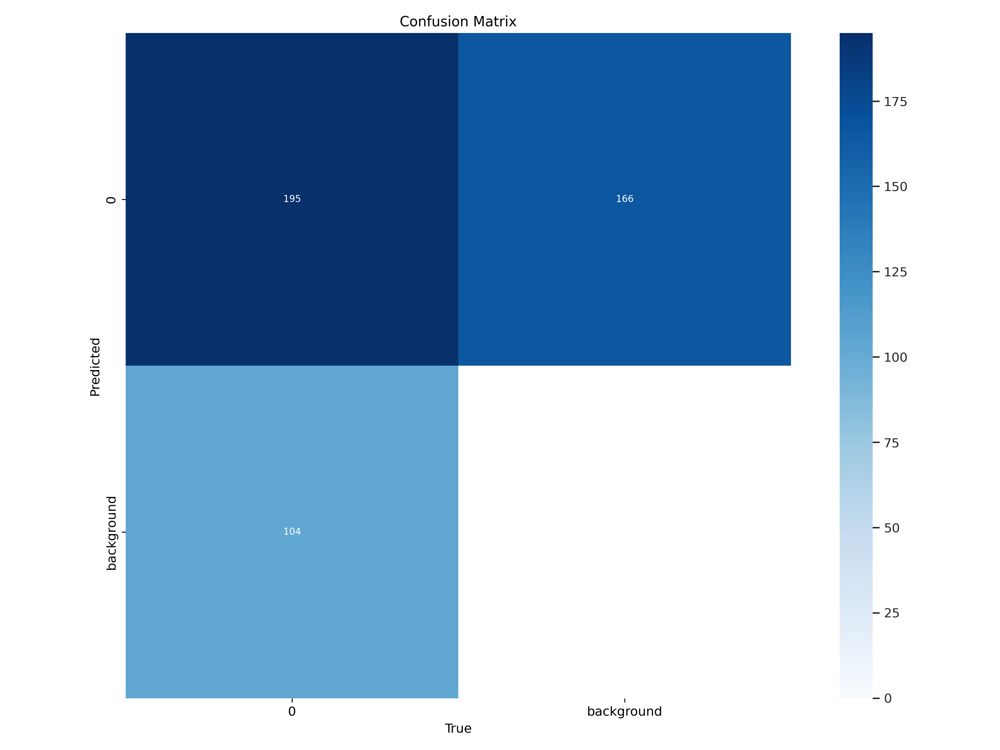

In [13]:
Image(filename=f'{HOME}/runs/detect/train/confusion_matrix.png', width=1000)

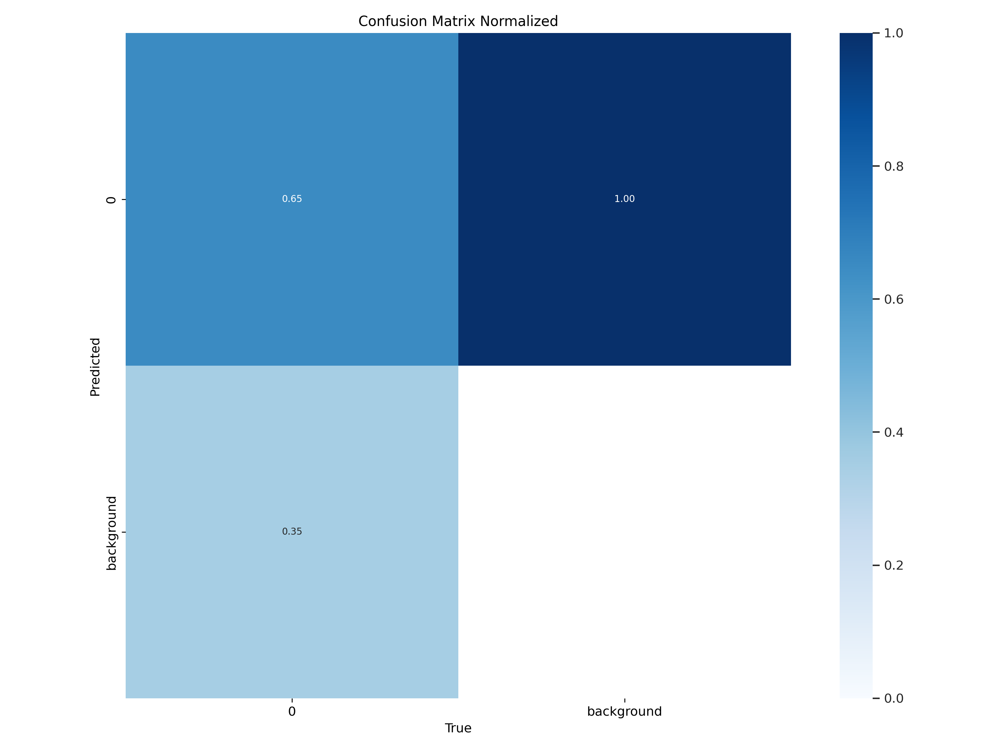

In [14]:
Image(filename=f'{HOME}/runs/detect/train/confusion_matrix_normalized.png', width=1000)

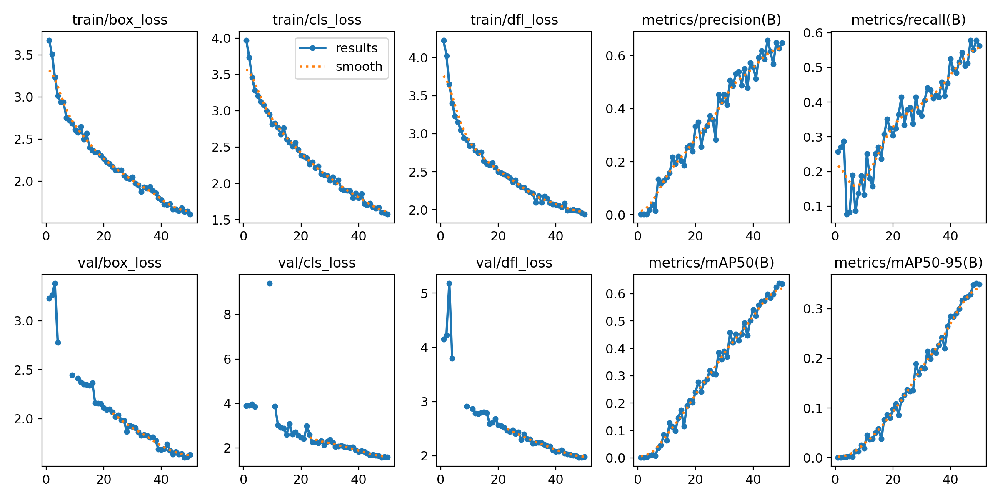

In [15]:
Image(filename=f'{HOME}/runs/detect/train/results.png', width=1000)

Precision = TP / (TP + FP)

Precision is simply true positives out of total detections.


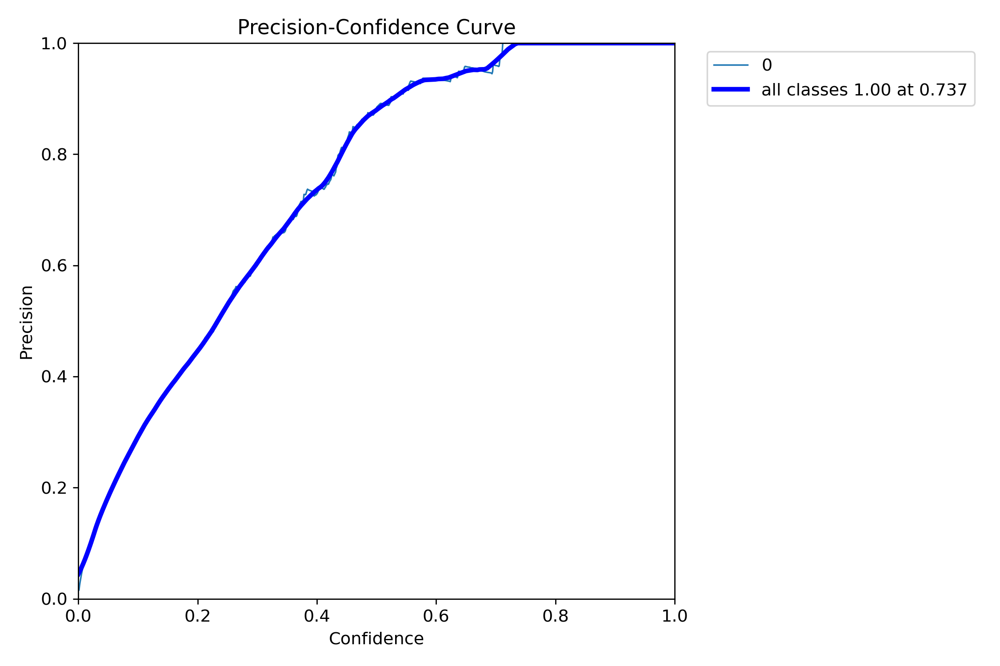

In [16]:
Image(filename=f'{HOME}/runs/detect/train/P_curve.png', width=1000)

Recall = TP / (TP + FN)

Recall is the True Positive out of all Ground Truths

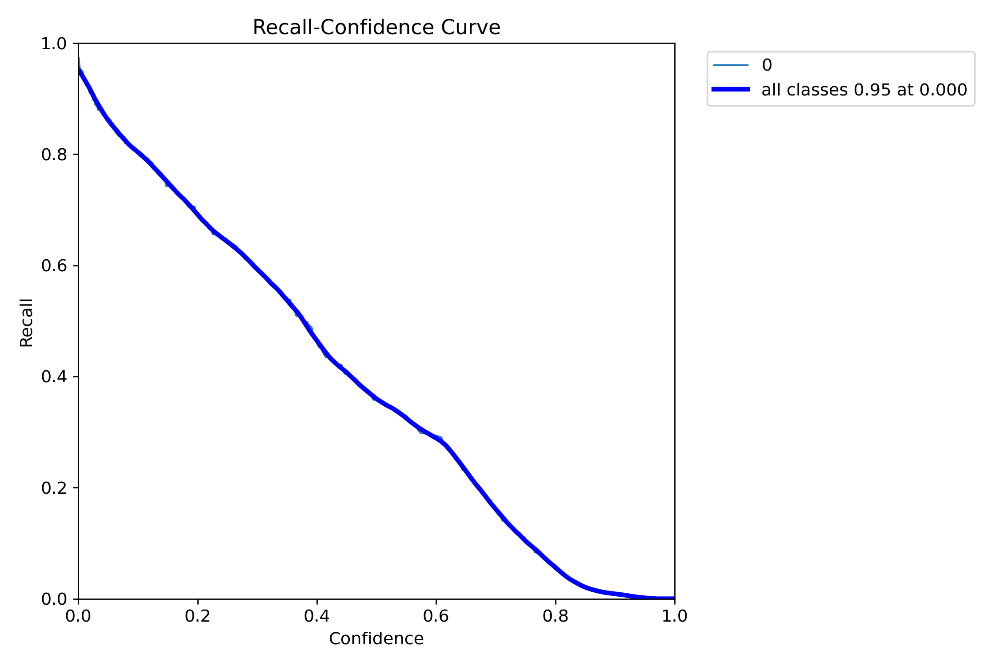

In [17]:
Image(filename=f'{HOME}/runs/detect/train/R_curve.png', width=1000)

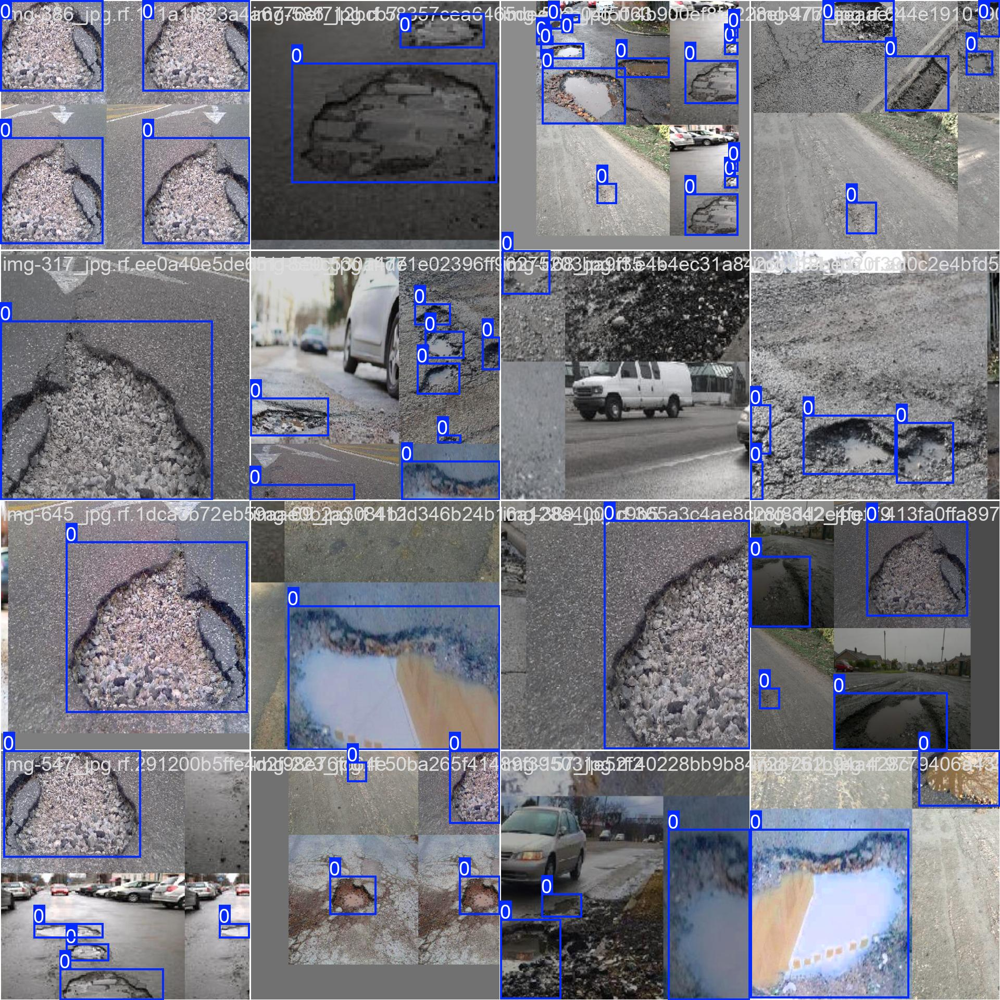

In [18]:
Image(filename=f'{HOME}/runs/detect/train/train_batch0.jpg', width=1000)

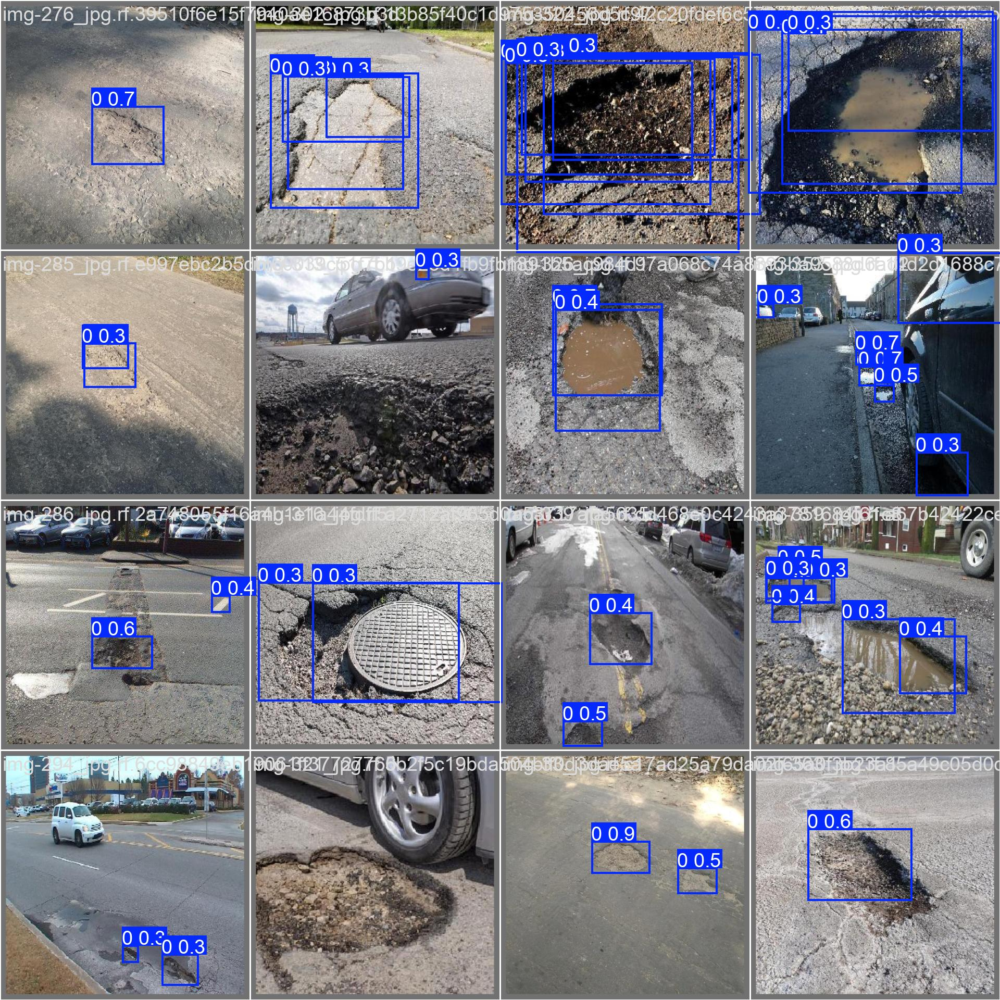

In [19]:
Image(filename=f'{HOME}/runs/detect/train/val_batch1_pred.jpg', width=1000)

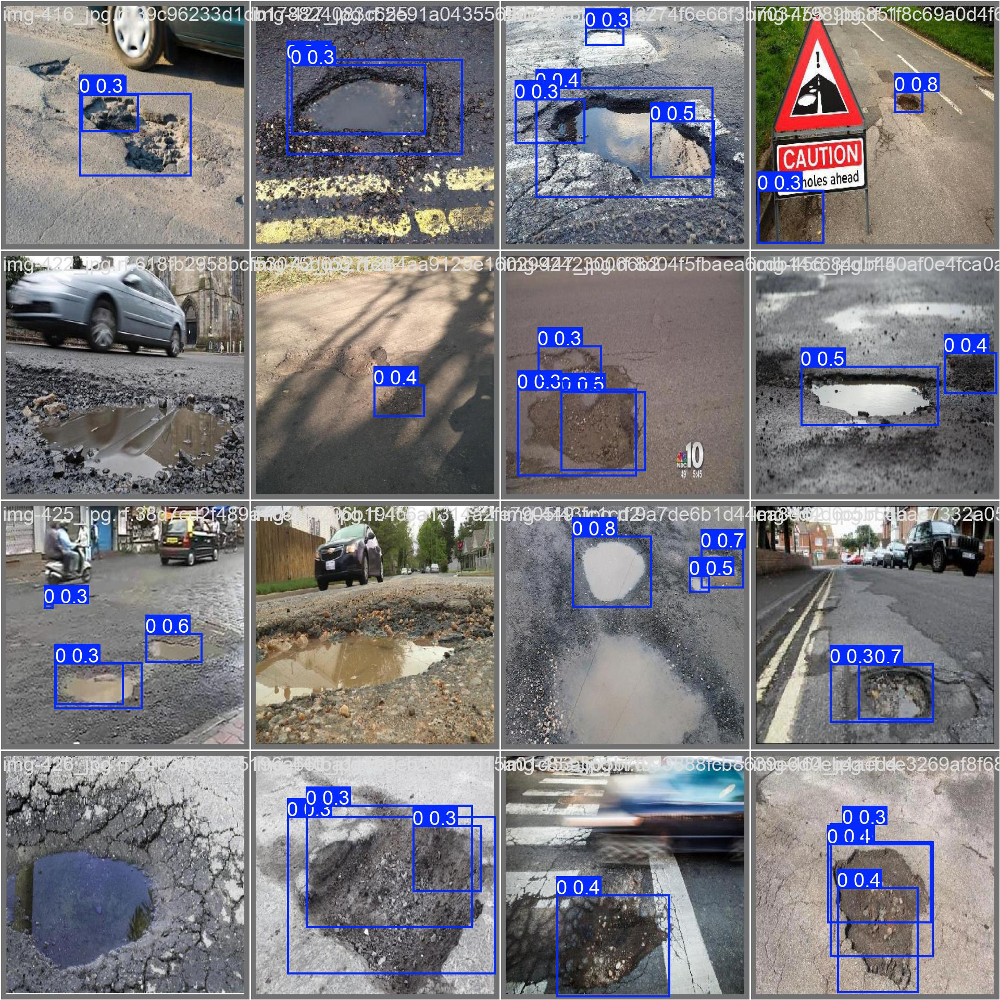

In [20]:
Image(filename=f'{HOME}/runs/detect/train/val_batch2_pred.jpg', width=1000)

**Step # 07  Validate Fine-Tuned Model**

In [21]:
model = YOLO("/content/runs/detect/train/weights/best.pt")  # load a custom model

# Validate the model
metrics = model.val()  # no arguments needed, dataset and settings remembered
metrics.box.map  # map50-95
metrics.box.map50  # map50
metrics.box.map75  # map75
metrics.box.maps  # a list contains map50-95 of each category

Ultralytics 8.3.63 🚀 Python-3.11.12 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLOv12m summary (fused): 402 layers, 19,577,299 parameters, 0 gradients, 59.5 GFLOPs


val: Scanning /content/Potholes-Detection-1/valid/labels.cache... 133 images, 0 backgrounds, 0 corrupt: 100%|██████████| 133/133 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:06<00:00,  1.37it/s]


                   all        133        299      0.625       0.58      0.637      0.351
Speed: 0.3ms preprocess, 35.9ms inference, 0.0ms loss, 3.1ms postprocess per image
Results saved to runs/detect/val


array([    0.35054])

**Step # 08 Inference with Custom Model on Images**

In [22]:
dataset.location

'/content/Potholes-Detection-1'

In [23]:
results = model.predict(source = f"{dataset.location}/test/images", save = True, iou = 0.1)


image 1/67 /content/Potholes-Detection-1/test/images/img-108_jpg.rf.fb2077bd1f912ba69ff9c156746cc3dc.jpg: 640x640 4 0s, 44.5ms
image 2/67 /content/Potholes-Detection-1/test/images/img-110_jpg.rf.6bb8649f02825991cecc7bd5aeab7c99.jpg: 640x640 2 0s, 54.5ms
image 3/67 /content/Potholes-Detection-1/test/images/img-114_jpg.rf.ed5a25d244280c6cb642156adc39327f.jpg: 640x640 1 0, 70.6ms
image 4/67 /content/Potholes-Detection-1/test/images/img-118_jpg.rf.f1bcde57217480d60871316a53900a71.jpg: 640x640 1 0, 56.9ms
image 5/67 /content/Potholes-Detection-1/test/images/img-119_jpg.rf.af8c3c350b56fd8d5b11dd6bc004ec95.jpg: 640x640 2 0s, 37.0ms
image 6/67 /content/Potholes-Detection-1/test/images/img-122_jpg.rf.6283a7ae2bdca95bf301030830e7b356.jpg: 640x640 1 0, 52.6ms
image 7/67 /content/Potholes-Detection-1/test/images/img-125_jpg.rf.530261e35624dab94482e8ae1df28f5d.jpg: 640x640 1 0, 37.0ms
image 8/67 /content/Potholes-Detection-1/test/images/img-141_jpg.rf.874c12943171fd16de27442ee4c53691.jpg: 640x640 

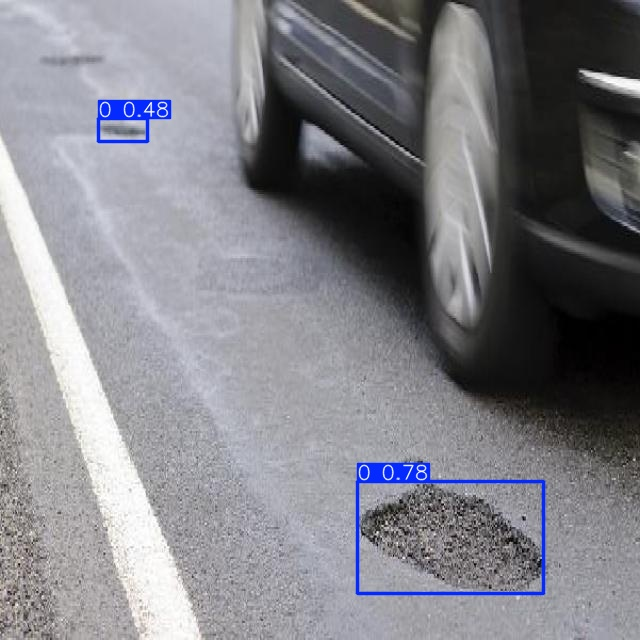

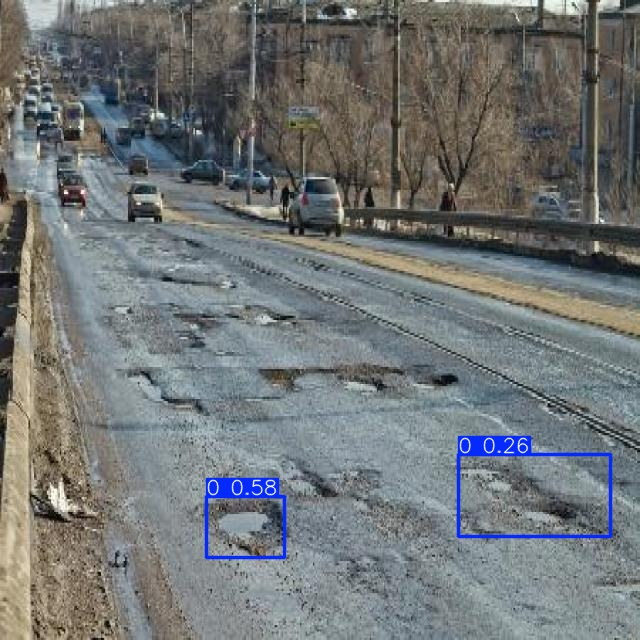

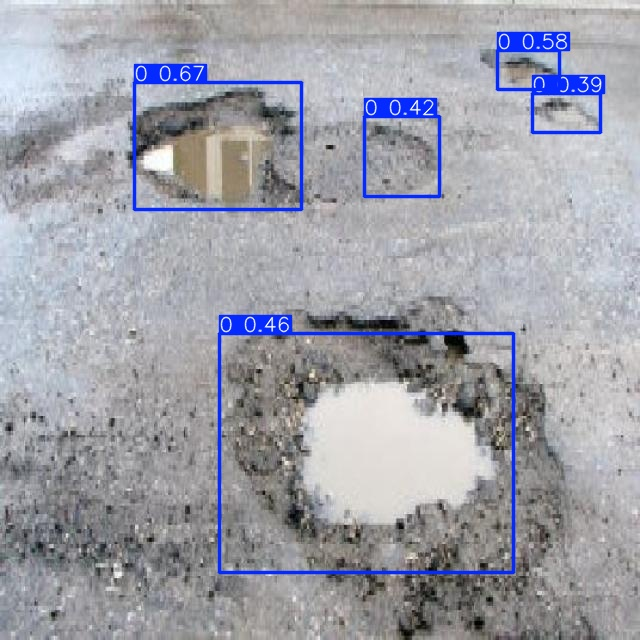

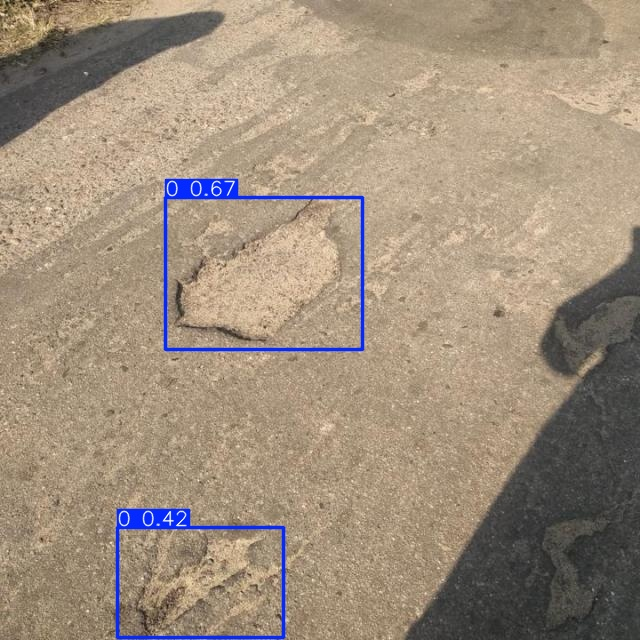

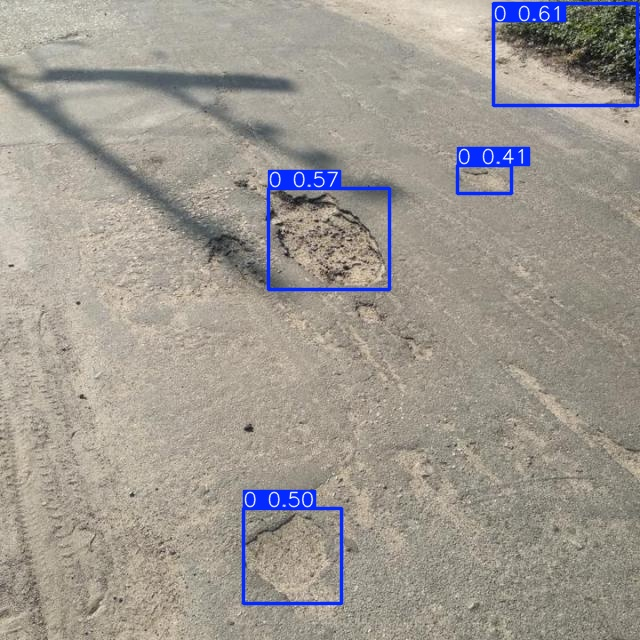

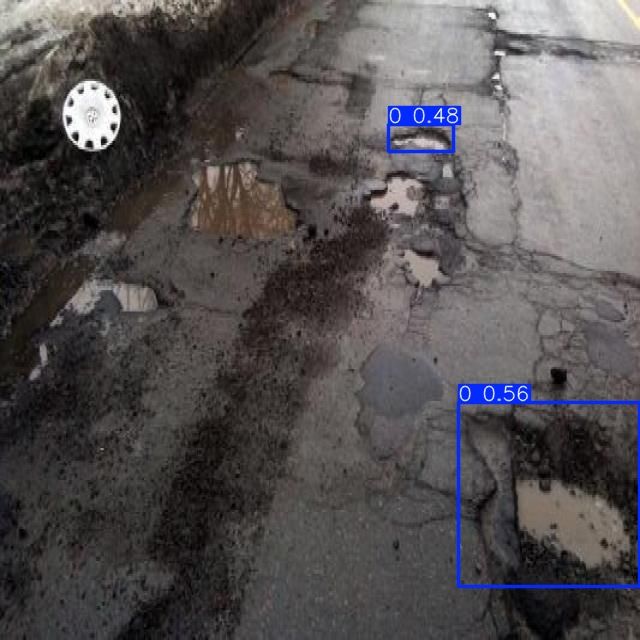

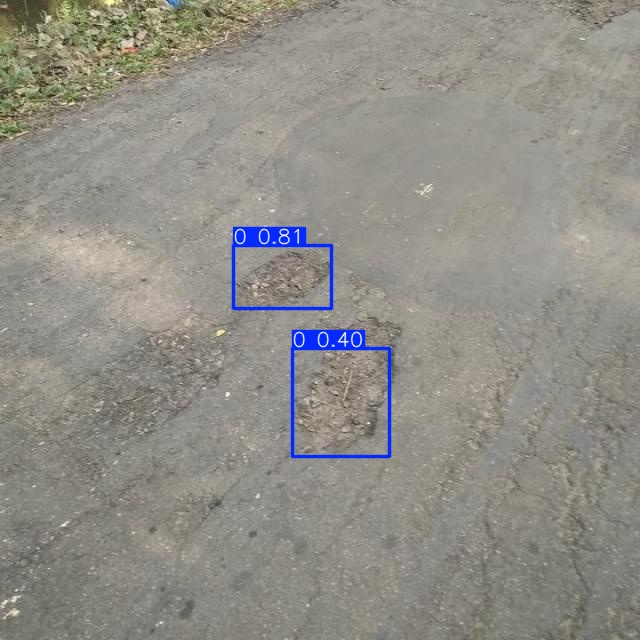

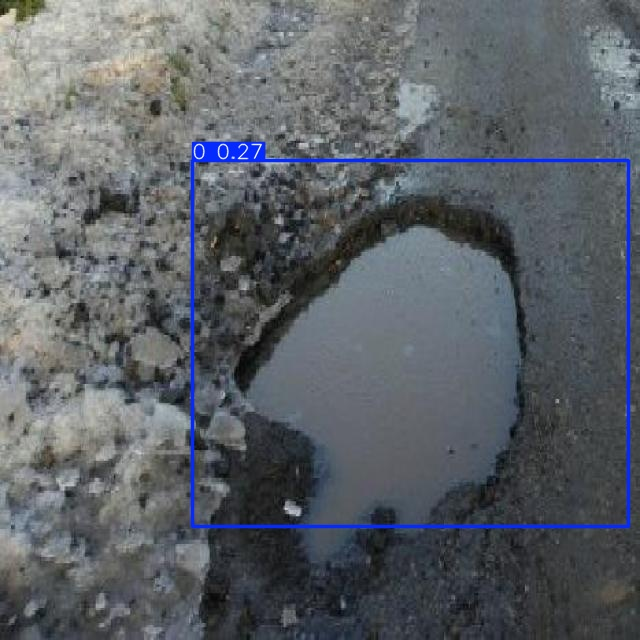

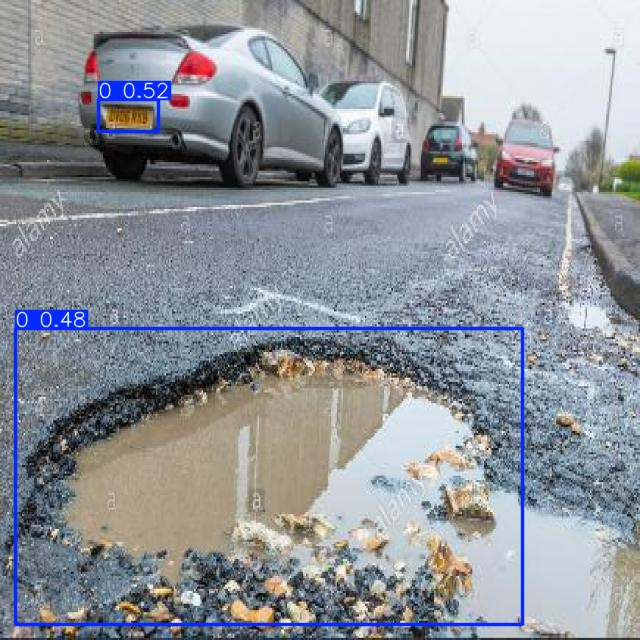

In [24]:
import glob
import os
from IPython.display import Image as IPyImage, display

latest_folder = max(glob.glob(f'{HOME}/runs/detect/predict*/'), key=os.path.getmtime)
for img in glob.glob(f'{latest_folder}/*.jpg')[1:10]:
    display(IPyImage(filename=img, width=600))
    print("\n")

**Step # 09 Inference with Custom Model on Videos**

In [26]:
import locale
locale.getpreferredencoding = lambda: "UTF-8"

In [27]:
!gdown "https://drive.google.com/uc?id=1iMitK9VCUWmBcZiiEPHK1d2pydALof6s&confirm=t"

Downloading...
From: https://drive.google.com/uc?id=1iMitK9VCUWmBcZiiEPHK1d2pydALof6s&confirm=t
To: /content/demo.mp4
100% 4.39M/4.39M [00:00<00:00, 29.9MB/s]


In [28]:
results = model.predict(source = f"/{HOME}/demo.mp4", save = True, iou = 0.1)



WARNING ⚠️ inference results will accumulate in RAM unless `stream=True` is passed, causing potential out-of-memory
errors for large sources or long-running streams and videos. See https://docs.ultralytics.com/modes/predict/ for help.

Example:
    results = model(source=..., stream=True)  # generator of Results objects
    for r in results:
        boxes = r.boxes  # Boxes object for bbox outputs
        masks = r.masks  # Masks object for segment masks outputs
        probs = r.probs  # Class probabilities for classification outputs

video 1/1 (frame 1/324) //content/demo.mp4: 384x640 2 0s, 56.0ms
video 1/1 (frame 2/324) //content/demo.mp4: 384x640 2 0s, 26.7ms
video 1/1 (frame 3/324) //content/demo.mp4: 384x640 2 0s, 26.7ms
video 1/1 (frame 4/324) //content/demo.mp4: 384x640 2 0s, 26.7ms
video 1/1 (frame 5/324) //content/demo.mp4: 384x640 2 0s, 23.1ms
video 1/1 (frame 6/324) //content/demo.mp4: 384x640 1 0, 23.1ms
video 1/1 (frame 7/324) //content/demo.mp4: 384x640 2 0s, 23.1ms
vi

In [29]:
!rm '/content/result_compressed.mp4'

rm: cannot remove '/content/result_compressed.mp4': No such file or directory


In [30]:
from IPython.display import HTML
from base64 import b64encode
import os

# Input video path
save_path = f'{HOME}/runs/detect/predict/demo.avi'

# Compressed video path
compressed_path = "/content/result_compressed.mp4"

os.system(f"ffmpeg -i {save_path} -vcodec libx264 {compressed_path}")

# Show video
mp4 = open(compressed_path,'rb').read()
data_url = "data:video/mp4;base64," + b64encode(mp4).decode()
HTML("""
<video width=400 controls>
      <source src="%s" type="video/mp4">
</video>
""" % data_url)